In [30]:
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
df = pd.read_csv('Preped_Data.csv')
df.drop(['Unnamed: 0', 'car_links'], axis=1, inplace=True)
# df.head()

In [31]:
df.isna().sum()[df.isna().sum() > 0].index.tolist()
print(f'Columns: {len(df.columns)}')
print(f'Rows: {df.shape[0]}')

Columns: 290
Rows: 8366


Formatting

In [32]:
low_values = [0, 1, 2, 3, 4, 5]
columns = ['Length', 'Width', 'Height', 'Wheel Base']
for column_name in columns: 
    df[column_name + '_Mode'] = df.groupby('Model')[column_name].transform(lambda x: x.mode()[0])

    df[column_name] = df.apply(lambda row: row[column_name + '_Mode'] if row[column_name] in low_values else row[column_name], axis=1)

    df.drop(columns=[column_name + '_Mode'], inplace=True)

    df[column_name + '_Mode'] = df.groupby('Brand')[column_name].transform(lambda x: x.mode()[0])

    df[column_name] = df.apply(lambda row: row[column_name + '_Mode'] if row[column_name] in low_values else row[column_name], axis=1)

    df.drop(columns=[column_name + '_Mode'], inplace=True)

In [33]:
df['Kerb Weight'] = df['Kerb Weight'].astype(int)

df['Value Configuration'] = df['Value Configuration'].str.upper()

df['Turbo Charger'] = df['Turbo Charger'].str.upper()

df['Super Charger'] = df['Super Charger'].str.upper()

df['Fuel Suppy System'] = df['Fuel Suppy System'].str.upper()

In [34]:
mapping = {
    'MPFI': 'MPFI',
    'MULTI POINT FUEL INJECTION': 'MPFI',
    'MULTIPOINT INJECTION': 'MPFI',
    'MULTI-POINT INJECTION': 'MPFI',
    'MPFI+LPG': 'MPFI',
    'MPI': 'MPFI',
    'MFI': 'MPFI',
    
    'CRDI': 'CRDI',
    'COMMON RAIL': 'CRDI',
    'COMMON-RAIL TYPE': 'CRDI',
    'COMMON RAIL DIRECT INJECTION': 'CRDI',
    'COMMON RAIL INJECTION': 'CRDI',
    'COMMON RAIL SYSTEM': 'CRDI',
    'COMMON RAIL DIRECT INJECTION (DCI)': 'CRDI',
    'COMMON RAIL DIESEL': 'CRDI',
    'ADVANCED COMMON RAIL': 'CRDI',
    'DIRECT INJECTION COMMON RAIL': 'CRDI',

    'EFI': 'EFI',
    'ELECTRONIC FUEL INJECTION': 'EFI',
    'EFI(ELECTRONIC FUEL INJECTION)': 'EFI',
    'EFI (ELECTRONIC FUEL INJECTION)': 'EFI',
    'ELECTRONIC FUEL INJECTION(EFI)': 'EFI',
    'ELECTRONIC INJECTION SYSTEM': 'EFI',
    'EFIC': 'EFI',
    'SEFI': 'EFI',
    'ELECTRONIC FUEL INJECTION (EFI)': 'EFI',
    
    'PGM-FI': 'PGM-FI',
    'PGM-FI (PROGRAMMED FUEL INJECTION)': 'PGM-FI',
    'PGM - FI': 'PGM-FI',
    'PGM-FI (PROGRAMMED FUEL INJECT)': 'PGM-FI',
    'PGM-FI (PROGRAMMED FUEL INJECTI)': 'PGM-FI',
    
    'DIRECT INJECTION': 'DIRECT INJECTION',
    'DIRECT FUEL INJECTION': 'DIRECT INJECTION',
    'GASOLINE DIRECT INJECTION': 'DIRECT INJECTION',
    'GDI': 'DIRECT INJECTION',
    
    'TFSI': 'TFSI',
    'TSI': 'TSI',
    'TGDI': 'TGDI',
    'TDI': 'TDI',
    'D-4S': 'D-4S',
    'DUAL VVT-I': 'DUAL VVT-I',
    'VVT-IE': 'VVT-IE',
    
    'SMPI': 'SMPI',
    'DPFI': 'DPFI',
    'DOHC': 'DOHC',
    
    'INDIRECT INJECTION': 'INDIRECT INJECTION',
    'IDI': 'INDIRECT INJECTION',
    
    'ISG': 'ISG',
    'INTELLIGENT-GAS PORT INJECTION': 'ISG',
    
    'CDI': 'CDI',
    'DDIS': 'DDIS',
    
    'ELECTRIC': 'ELECTRIC',
    'TI-VCT': 'TI-VCT',
    
    'DEDST': 'DEDST',
    'DIRECT INJECTIO': 'DIRECT INJECTION',
}

# Correct any possible duplicates or near duplicates
mapping.update({
    'DIRECT INJECTIO': 'DIRECT INJECTION',
    'MPFI': 'MPFI',
    'PGM - FI': 'PGM-FI',
    'PGM-FI (PROGRAMMED FUEL INJECTION)': 'PGM-FI',
    'EFI(ELECTRONIC FUEL INJECTION)': 'EFI',
    'EFI (ELECTRONIC FUEL INJECTION)': 'EFI',
})

df['Fuel Suppy System'] = df['Fuel Suppy System'].map(lambda x: mapping.get(x, x))

In [35]:
mapping_gearbox = {
    '5 Speed': '5 Speed',
    '5-Speed': '5 Speed',
    '5': '5 Speed',
    '5-Speed`': '5 Speed',
    'Five Speed Manual': '5 Speed',
    'Five Speed Manual Transmission Gearbox': '5 Speed',
    'Five Speed Manual Transmission': '5 Speed',
    '5 speed': '5 Speed',
    '5 Speed CVT': '5 Speed CVT',
    '5 Speed AT+ Paddle Shifters': '5 Speed AT+ Paddle Shifters',
    '5 Speed Manual (Cable Type Gear Shift)': '5 Speed',
    '5 speed manual': '5 Speed',
    
    '6 Speed': '6 Speed',
    '6-Speed': '6 Speed',
    '6-speed': '6 Speed',
    'Six Speed Manual': '6 Speed',
    'Six Speed Manual with Paddle Shifter': '6 Speed',
    '6 Speed iMT': '6 Speed iMT',
    '6-Speed iMT': '6 Speed iMT',
    '6 Speed IMT': '6 Speed iMT',
    '6-Speed IMT': '6 Speed iMT',
    '6 Speed MT': '6 Speed',
    '6 Speed AT': '6 Speed AT',
    '6-Speed AT': '6 Speed AT',
    '6-speed IVT': '6 Speed IVT',
    '6-Speed IVT': '6 Speed IVT',
    '6 Speed IVT': '6 Speed IVT',
    '6-speed AutoSHIFT': '6 Speed AutoSHIFT',
    '6 Speed AutoSHIFT': '6 Speed AutoSHIFT',
    'Six Speed Automatic Transmission': '6 Speed Automatic',
    'Six Speed Automatic Gearbox': '6 Speed Automatic',
    'Six Speed Geartronic': '6 Speed',
    '6 speed automatic': '6 Speed Automatic',
    '6-Speed DCT': '6 Speed DCT',
    '6 Speed DCT': '6 Speed DCT',
    '6-speed DCT': '6 Speed DCT',
    'AMG SPEEDSHIFT DCT 8G': '8 Speed DCT',
    
    '7 Speed': '7 Speed',
    '7-Speed': '7 Speed',
    '7-speed': '7 Speed',
    '7G-DCT': '7 Speed DCT',
    '7G DCT 7-Speed Dual Clutch Transmission': '7 Speed DCT',
    '7-Speed DCT': '7 Speed DCT',
    '7-speed DCT': '7 Speed DCT',
    'AMG 7-SPEED DCT': '7 Speed DCT',
    '7 Speed DCT': '7 Speed DCT',
    '7 Speed 7G-DCT': '7 Speed DCT',
    '7-Speed DSG': '7 Speed DSG',
    '7 Speed DSG': '7 Speed DSG',
    '7-Speed S-Tronic': '7 Speed S-Tronic',
    '7-Speed S tronic': '7 Speed S-Tronic',
    '7-Speed Stronic': '7 Speed S-Tronic',
    '7-Speed S-Tronic': '7 Speed S-Tronic',
    '7-speed Stronic': '7 Speed S-Tronic',
    '7-Speed Steptronic': '7 Speed Steptronic',
    '7 Speed Steptronic Sport': '7 Speed Steptronic Sport',
    '7 Speed CVT': '7 Speed CVT',
    '7-Speed CVT': '7 Speed CVT',
    '7-speed PDK': '7 Speed PDK',
    '7-speed automatic': '7 Speed Automatic',
    'Mercedes Benz 7 Speed Automatic': '7 Speed Automatic',
    '7G TRONIC': '7 Speed Tronic',
    '9G-TRONIC': '9 Speed Tronic',
    
    '8 Speed': '8 Speed',
    '8-Speed': '8 Speed',
    '8-speed': '8 Speed',
    '8Speed': '8 Speed',
    '8 Speed Steptronic': '8 Speed Steptronic',
    '8-Speed Steptronic': '8 Speed Steptronic',
    '8-Speed Steptronic Sport Automatic Transmission': '8 Speed Steptronic',
    '8-Speed Steptronic Automatic': '8 Speed Steptronic',
    '8 Speed Tiptronic': '8 Speed Tiptronic',
    '8-Speed DCT': '8 Speed DCT',
    '8G-DCT': '8 Speed DCT',
    '8 Speed Sport': '8 Speed Sport',
    '8 Speed CVT': '8 Speed CVT',
    
    '9 Speed': '9 Speed',
    '9-Speed': '9 Speed',
    '9-speed': '9 Speed',
    '9G TRONIC': '9 Speed Tronic',
    '9-speed automatic': '9 Speed Automatic',
    '9 Speed Tronic': '9 Speed Tronic',
    '9G-TRONIC automatic': '9 Speed Tronic',
    
    '4 Speed': '4 Speed',
    '4-Speed': '4 Speed',
    '4-speed': '4 Speed',
    
    'CVT': 'CVT',
    'E-CVT': 'CVT',
    'IVT': 'IVT',
    'iMT': 'iMT',
    'Single Speed': 'Single Speed',
    'Single speed reduction gear': 'Single Speed',
    
    'AGS': 'AGS',
    'TCT': 'TCT',
    '5 Speed AGS': '5 Speed AGS',
    '10 Speed': '10 Speed',
    '10-Speed Automatic': '10 Speed Automatic',
    '10 speed': '10 Speed',
    'Fully Automatic': 'Fully Automatic',
    'DCT': 'DCT',
}

# Update mapping with near duplicates if necessary
mapping_gearbox.update({
    '10 speed': '10 Speed',
    '9 -speed': '9 Speed',
    'E-CVT': 'CVT',
    '6 speed': '6 Speed',
    'Five Speed': '5 Speed',
    'Six Speed  Gearbox': '6 Speed',
})

df['Gear Box'] = df['Gear Box'].map(lambda x: mapping_gearbox.get(x, x))

In [36]:
mapping_drivetype = {
    'FWD': 'FWD',
    'Front Wheel Drive': 'FWD',
    
    'RWD': 'RWD',
    'Rear Wheel Drive with ESP': 'RWD',
    'RWD(with MTT)': 'RWD',
    
    'AWD': 'AWD',
    'All Wheel Drive': 'AWD',
    'AWD INTEGRATED MANAGEMENT': 'AWD',
    'Permanent all-wheel drive quattro': 'AWD',
    
    '4WD': '4WD',
    '4 WD': '4WD',
    '4x4': '4WD',
    '4X4': '4WD',
    
    '2WD': '2WD',
    '2 WD': '2WD',
    '2WD': '2WD',
    '4X2': '2WD',
    '4x2': '2WD',
    'Two Wheel Drive': '2WD',
}

# Update mapping with duplicates or alternate cases
mapping_drivetype.update({
    '4 WD': '4WD',
    '2 WD': '2WD',
})

df['Drive Type'] = df['Drive Type'].map(lambda x: mapping_drivetype.get(x, x))

In [37]:
mapping_steeringtype = {
    'Power': 'Power',
    'power': 'Power',  # Lowercase version mapped to 'Power'
    'Electric': 'Electric',
    'electric': 'Electric',  # Lowercase version mapped to 'Electric'
    'Electronic': 'Electric',  # Electronic mapped to 'Electric'
    'Electrical': 'Electric',  # Electrical mapped to 'Electric'
    'EPAS': 'Electric',  # EPAS mapped to 'Electric'
    'Manual': 'Manual',
    'Hydraulic': 'Hydraulic',
}
df['Steering Type'] = df['Steering Type'].map(lambda x: mapping_steeringtype.get(x, x))


In [38]:
mapping_braketype = {
    'Disc': 'Disc',
    'Disc & Caliper Type': 'Disc',
    'Disc brakes': 'Disc',
    'Disc brakes': 'Disc',
    'Disc,internally ventilated': 'Disc',
    'Disc': 'Disc',
    'Ventilated Disc': 'Ventilated Disc',
    'Ventilated Discs': 'Ventilated Disc',
    'Ventilated Disk': 'Ventilated Disc',
    'Ventilated discs': 'Ventilated Disc',
    'Ventilated DIsc': 'Ventilated Disc',
    'Ventlated Disc': 'Ventilated Disc',
    'Ventillated Disc': 'Ventilated Disc',
    'ventilated Disc': 'Ventilated Disc',
    'Ventilated Disc': 'Ventilated Disc',
    'Solid Disc': 'Solid Disc',
    'Solid Disc': 'Solid Disc',
    'Drum': 'Drum',
    'ABS': 'ABS',
    'Booster assisted ventilated disc': 'Ventilated Disc',
    'Electric Parking Brake': 'Electric Parking Brake',
    'Caliper Ventilated Disc': 'Ventilated Disc',
    'Multilateral Disc': 'Disc',  # Assuming this is similar to 'Disc'
    'Vacuum assisted hydraulic dual circuit w': 'Disc'  # Assuming this is similar to 'Disc'
}

df['Front Brake Type'] = df['Front Brake Type'].map(lambda x: mapping_braketype.get(x, x))

In [39]:
mapping_rearbraketype = {
    'Drum': 'Drum',
    'Drums': 'Drum',
    'Leading-Trailing Drum': 'Drum',
    'Self-Adjusting Drum': 'Drum',
    'Self Adjusting Drums': 'Drum',
    'Drum`': 'Drum',
    'Drum in Discs': 'Drum',
    'Drum in disc': 'Drum',
    '228.6 mm dia, drums on rear wheels': 'Drum',
    
    'Disc': 'Disc',
    'Discs': 'Disc',
    'Disc & Caliper Type': 'Disc',
    'Electric Parking Brake': 'Electric Parking Brake',
    'Solid Disc': 'Solid Disc',
    
    'Ventilated Disc': 'Ventilated Disc',
    'Ventilated Discs': 'Ventilated Disc',
    'Ventilated discs': 'Ventilated Disc',
    'Ventilated Drum': 'Ventilated Disc',  # Assuming this is similar to 'Ventilated Disc'
    'Ventialte Disc': 'Ventilated Disc',
    
    'Mechanical-hydraulic dual circuit': 'Disc',  # Assuming this is similar to 'Disc'
    'Vacuum assisted hydraulic dual circuit w': 'Disc',  # Assuming this is similar to 'Disc'
    'Booster assisted drum': 'Drum',  # Assuming this is similar to 'Drum'
    'Self Adjusting Drum': 'Drum'
}

df['Rear Brake Type'] = df['Rear Brake Type'].map(lambda x: mapping_rearbraketype.get(x, x))


In [40]:
mapping_tyres = {
    'Tubeless,Radial': 'Tubeless Radial',
    'Tubeless, Radial': 'Tubeless Radial',
    'Tubeless': 'Tubeless',
    'Tubeless Tyres': 'Tubeless',
    'Radial, Tubeless': 'Radial Tubeless',
    'Radial': 'Radial',
    'Radial, Tubless': 'Radial Tubeless',
    'Tubeless Tyres, Radial': 'Tubeless Radial',
    'Tubeless,Radial': 'Tubeless Radial',
    'Radial,Tubeless': 'Radial Tubeless',
    'Tubeless Radial Tyres': 'Tubeless Radial',
    'Tubeless,Radials': 'Tubeless Radial',
    'tubeless tyre': 'Tubeless',
    'Tubless, Radial': 'Tubeless Radial',
    'Tubeless,Runflat': 'Tubeless Runflat',
    'Tubeless, Runflat': 'Tubeless Runflat',
    'Run-Flat': 'Runflat',
    'Runflat': 'Runflat',
    'Runflat Tyres': 'Runflat',
    'Tubeless Tyres Mud Terrain': 'Tubeless Mud Terrain',
    'Tubeless Radials Tyre': 'Tubeless Radial',
    'Tubeless. Runflat': 'Tubeless Runflat',
    'Radial with tube': 'Radial',
    'Tubeless Tyre': 'Tubeless',
    'Tubeless Radial': 'Tubeless Radial',
    'Tubless,Radial': 'Tubeless Radial',
    'Runflat,Radial': 'Runflat Radial',
    'Radial Tyres': 'Radial',
    'Tubeless Tyres All Terrain': 'Tubeless All Terrain',
    'Tubeless, Radials': 'Tubeless Radial'
}

df['Tyre Type'] = df['Tyre Type'].map(lambda x: mapping_tyres.get(x, x))


In [41]:
df.isna().sum()[df.isna().sum() > 0].index.tolist()

[]

# Outliers

In [42]:
condition = (df['KMs Driven'] < 150000) & (df['Model Year'] > 2005) & (df['Engine Displacement'] > 500) & (df['Engine Displacement'] < 3500) & (df['Mileage'] < 30) & (df['Mileage'] > 10) & (df['Seating Capacity'] >= 4) & (df['Price'] <= 20000000)
df = df[condition]
df.shape[0]

8023

In [43]:
print(f'Columns: {len(df.columns)}')
print(f'Rows: {df.shape[0]}')

Columns: 290
Rows: 8023


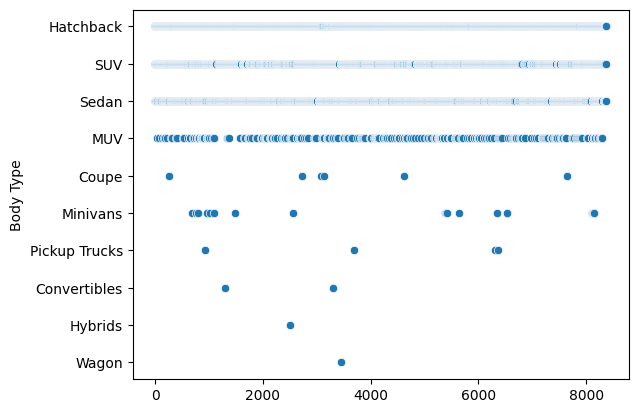

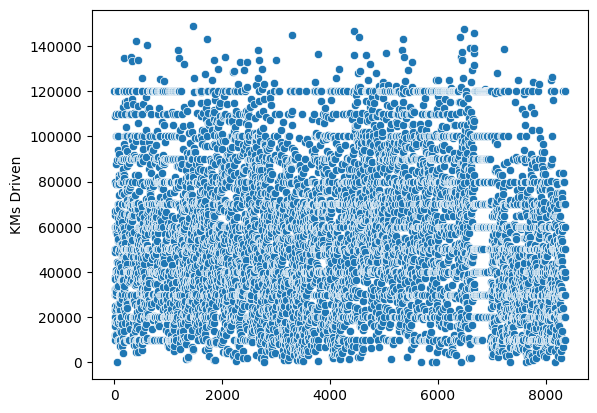

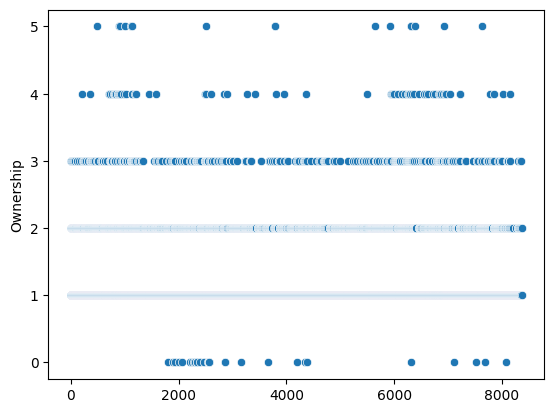

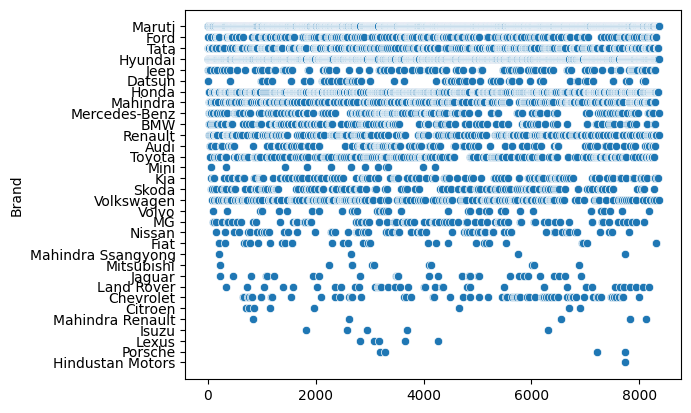

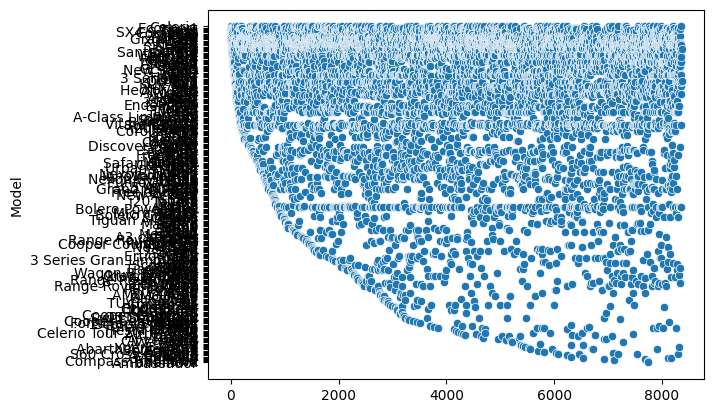

...

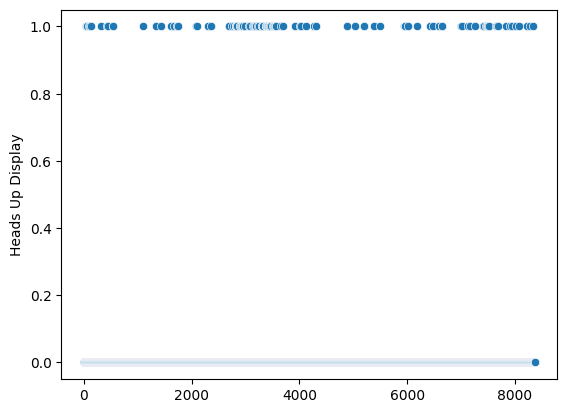

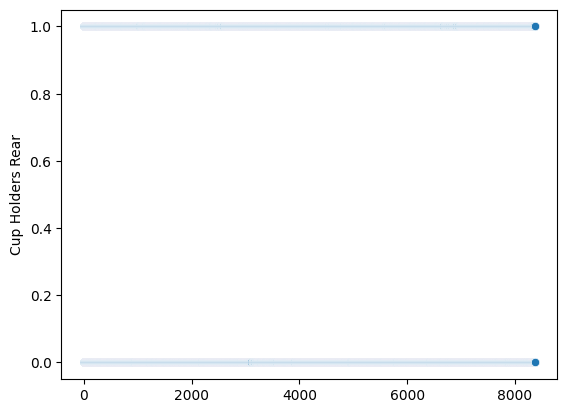

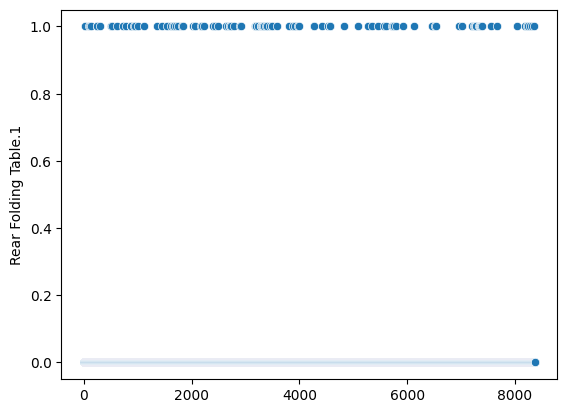

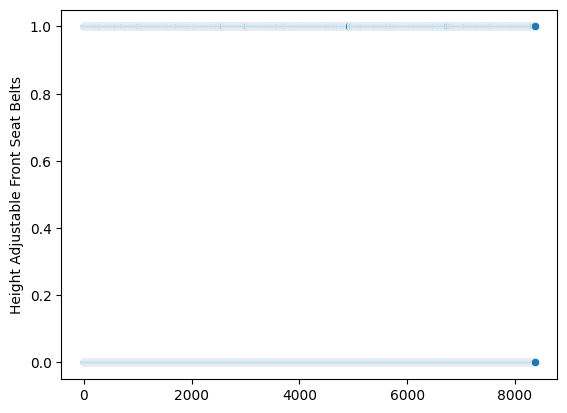

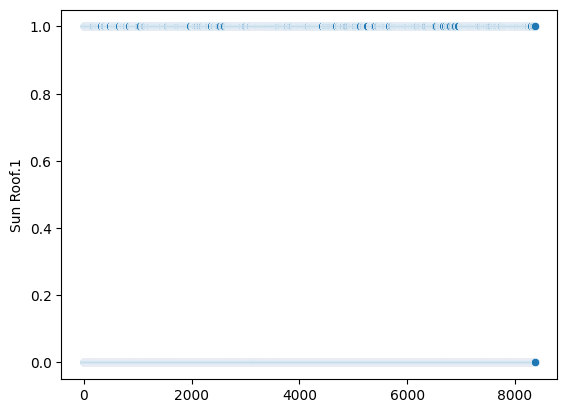

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

for columns in df.columns:
    x = df[columns]

    sns.scatterplot(x)
    plt.show()

In [44]:
df.to_csv('Car_Details.csv')

# Encoding

In [21]:
df.head()

,Body Type,KMs Driven,Ownership,Brand,Model,Model Year,Variant ID,Variant Name,Price,Registration Year,Insurance Validity,Fuel Type,Engine Displacement,Transmission,Year of Manufacture,Mileage,Seating Capacity,Color,Engine Type,Max Power,Max Torque,No of Cylinder,Values per Cylinder,Value Configuration,Fuel Suppy System,Turbo Charger,Super Charger,Length,Width,Height,Wheel Base,Kerb Weight,Gear Box,Drive Type,Steering Type,Turning Radius,Front Brake Type,Rear Brake Type,Tyre Type,Doors,Cargo Volumn,City,Anti Lock Braking System,Anti Theft Alarm,Electronic Multi Tripmeter,Moon Roof,Multifunction Steering Wheel,Remote Trunk Opener,Fog Lights Front,Leather Steering Wheel,Day Night Rear View Mirror,Trunk Light,Speakers Front,Dvd Player,Tinted Glass,Radio,Tachometer,Adjustable Steering,Cruise Control,Child Safety Locks,Cassette Player,Cup Holders Front,Passenger Air Bag,Glove Compartment,Digital Odometer,Drive Modes,Cd Player,Power Windows Front,Remote Fuel Lid Opener,Manually Adjustable Exterior Rear View Mirror,Accessory Power Outlet,Alloy Wheels,Centeral Locking,Electric Folding Rear View Mirror,Adjustable Head Lights,Leather Seats,Bluetooth,Side Air Bag Front,Engine Immobilizer,Vanity Mirror,Rear Window Wiper,Halogen Headlamps,Rear Spoiler,Power Steering,Wheel Covers,Brake Assist,Fabric Upholstery,Rear Window Defogger,Power Antenna,Speakers Rear,Usb Auxiliary Input,LEDDRLs,Power Door Locks,Fog Lights Rear,Passenger Side Rear View Mirror,Power Windows Rear,Adjustable Seats,Heater,Digital Clock,Integrated2Din Audio,Number Of Speaker,Air Quality Control,Integrated Antenna,Tyre Pressure Monitor,Low Fuel Warning Light,Rear Seat Belts,Sun Roof,Driver Air Bag,Cd Changer,Rear Seat Headrest,Power Adjustable Exterior Rear View Mirror,Rear Folding Table,Air Conditioner,Driving Experience Control Eco,Navigation System,Audio System Remote Control,Touch Screen,Front Impact Beams,Remote Trunk Opener.1,Anti Theft Device,Day Night Rear View Mirror.1,Dvd Player.1,Ventilated Seats,Speed Sensing Auto Door Lock,Cup Holders Front.1,Anti Pinch Power Windows,Battery Saver,Tailgate Ajar,Remote Fuel Lid Opener.1,Power Windows Front.1,Accessory Power Outlet.1,Alloy Wheels.1,View360Camera,Leather Seats.1,Electric Folding Rear View Mirror.1,Power Folding3rd Row Seat,Smart Key Band,Rear Entertainment System,Rear Window Wiper.1,Rear Window Defogger.1,Chrome Grille,Speakers Rear.1,Usb Auxiliary Input.1,Keyless Entry,Power Door Locks.1,Compass,Remote Climate Control,Digital Clock.1,Ebd,Geo Fence Alert,Follow Me Home Headlamps,Find My Car Location,Centrally Mounted Fuel Tank,LEDTaillights,Power Adjustable Exterior Rear View Mirror.1,Rear Camera,Electronic Multi Tripmeter.1,Anti Theft Alarm.1,Projector Headlamps,Clutch Lock,Rear Window Washer,Cruise Control.1,Remote Engine Start Stop,Cassette Player.1,Crash Sensor,Glove Compartment.1,Engine Check Warning,Manually Adjustable Exterior Rear View Mirror.1,Smart Access Card Entry,Automatic Driving Lights,Traction Control,Voice Control,Fabric Upholstery.1,Seat Lumbar Support,Brake Assist.1,Isofix Child Seat Mounts,Active Noise Cancellation,Power Antenna.1,Blind Spot Monitor,LEDDRLs.1,Power Windows Rear.1,Rain Sensing Wiper,Removable Convertible Top,Number Of Speaker.1,Dual Tone Dashboard,Knee Airbags,Internal Storage,Rear Seat Belts.1,Driver Air Bag.1,Cd Changer.1,Rear Seat Headrest.1,No Of Airbags,Side Impact Beams,Air Conditioner.1,Touch Screen Size,Steering Mounted Tripmeter,Audio System Remote Control.1,Roof Rail,Eletronic Stability Control,Rear ACVents,Outside Rear View Mirror Turn Indicators,Leather Steering Wheel.1,Chrome Garnish,Wireless Phone Charging,Apple Car Play,Tinted Glass.1,Radio.1,Adjustable Steering.1,Child Safety Locks.1,Gear Shift Indicator,Digital Odometer.1,Drive Modes.1,Centeral Locking.1,Bluetooth.1,Side Air Bag Front.1,LEDHeadlights,Engine Immobilizer.1,Vanity Mirror.1,Halogen Headlamps.1,Rear Spoiler.1,Power Boot,Remote Horn Light Control,Hill Descent Control,Leather Wrap Gear Shift Selector,

In [22]:
columns = ['Body Type', 'Variant Name', 'Insurance Validity', 'Fuel Type', 'Transmission', 'Color', 'Engine Type', 'Max Power', 'Max Torque', 'Value Configuration',
           'Fuel Suppy System', 'Turbo Charger', 'Super Charger', 'Gear Box', 'Drive Type', 'Steering Type', 'Front Brake Type', 'Rear Brake Type', 'Tyre Type',
           'City']

for i in columns:
    order = df[i].value_counts().index.tolist()
    mapping = {category: idx for idx, category in enumerate(order)}
    df[i] = df[i].map(mapping)

In [23]:
df.head()

,Body Type,KMs Driven,Ownership,Brand,Model,Model Year,Variant ID,Variant Name,Price,Registration Year,Insurance Validity,Fuel Type,Engine Displacement,Transmission,Year of Manufacture,Mileage,Seating Capacity,Color,Engine Type,Max Power,Max Torque,No of Cylinder,Values per Cylinder,Value Configuration,Fuel Suppy System,Turbo Charger,Super Charger,Length,Width,Height,Wheel Base,Kerb Weight,Gear Box,Drive Type,Steering Type,Turning Radius,Front Brake Type,Rear Brake Type,Tyre Type,Doors,Cargo Volumn,City,Anti Lock Braking System,Anti Theft Alarm,Electronic Multi Tripmeter,Moon Roof,Multifunction Steering Wheel,Remote Trunk Opener,Fog Lights Front,Leather Steering Wheel,Day Night Rear View Mirror,Trunk Light,Speakers Front,Dvd Player,Tinted Glass,Radio,Tachometer,Adjustable Steering,Cruise Control,Child Safety Locks,Cassette Player,Cup Holders Front,Passenger Air Bag,Glove Compartment,Digital Odometer,Drive Modes,Cd Player,Power Windows Front,Remote Fuel Lid Opener,Manually Adjustable Exterior Rear View Mirror,Accessory Power Outlet,Alloy Wheels,Centeral Locking,Electric Folding Rear View Mirror,Adjustable Head Lights,Leather Seats,Bluetooth,Side Air Bag Front,Engine Immobilizer,Vanity Mirror,Rear Window Wiper,Halogen Headlamps,Rear Spoiler,Power Steering,Wheel Covers,Brake Assist,Fabric Upholstery,Rear Window Defogger,Power Antenna,Speakers Rear,Usb Auxiliary Input,LEDDRLs,Power Door Locks,Fog Lights Rear,Passenger Side Rear View Mirror,Power Windows Rear,Adjustable Seats,Heater,Digital Clock,Integrated2Din Audio,Number Of Speaker,Air Quality Control,Integrated Antenna,Tyre Pressure Monitor,Low Fuel Warning Light,Rear Seat Belts,Sun Roof,Driver Air Bag,Cd Changer,Rear Seat Headrest,Power Adjustable Exterior Rear View Mirror,Rear Folding Table,Air Conditioner,Driving Experience Control Eco,Navigation System,Audio System Remote Control,Touch Screen,Front Impact Beams,Remote Trunk Opener.1,Anti Theft Device,Day Night Rear View Mirror.1,Dvd Player.1,Ventilated Seats,Speed Sensing Auto Door Lock,Cup Holders Front.1,Anti Pinch Power Windows,Battery Saver,Tailgate Ajar,Remote Fuel Lid Opener.1,Power Windows Front.1,Accessory Power Outlet.1,Alloy Wheels.1,View360Camera,Leather Seats.1,Electric Folding Rear View Mirror.1,Power Folding3rd Row Seat,Smart Key Band,Rear Entertainment System,Rear Window Wiper.1,Rear Window Defogger.1,Chrome Grille,Speakers Rear.1,Usb Auxiliary Input.1,Keyless Entry,Power Door Locks.1,Compass,Remote Climate Control,Digital Clock.1,Ebd,Geo Fence Alert,Follow Me Home Headlamps,Find My Car Location,Centrally Mounted Fuel Tank,LEDTaillights,Power Adjustable Exterior Rear View Mirror.1,Rear Camera,Electronic Multi Tripmeter.1,Anti Theft Alarm.1,Projector Headlamps,Clutch Lock,Rear Window Washer,Cruise Control.1,Remote Engine Start Stop,Cassette Player.1,Crash Sensor,Glove Compartment.1,Engine Check Warning,Manually Adjustable Exterior Rear View Mirror.1,Smart Access Card Entry,Automatic Driving Lights,Traction Control,Voice Control,Fabric Upholstery.1,Seat Lumbar Support,Brake Assist.1,Isofix Child Seat Mounts,Active Noise Cancellation,Power Antenna.1,Blind Spot Monitor,LEDDRLs.1,Power Windows Rear.1,Rain Sensing Wiper,Removable Convertible Top,Number Of Speaker.1,Dual Tone Dashboard,Knee Airbags,Internal Storage,Rear Seat Belts.1,Driver Air Bag.1,Cd Changer.1,Rear Seat Headrest.1,No Of Airbags,Side Impact Beams,Air Conditioner.1,Touch Screen Size,Steering Mounted Tripmeter,Audio System Remote Control.1,Roof Rail,Eletronic Stability Control,Rear ACVents,Outside Rear View Mirror Turn Indicators,Leather Steering Wheel.1,Chrome Garnish,Wireless Phone Charging,Apple Car Play,Tinted Glass.1,Radio.1,Adjustable Steering.1,Child Safety Locks.1,Gear Shift Indicator,Digital Odometer.1,Drive Modes.1,Centeral Locking.1,Bluetooth.1,Side Air Bag Front.1,LEDHeadlights,Engine Immobilizer.1,Vanity Mirror.1,Halogen Headlamps.1,Rear Spoiler.1,Power Boot,Remote Horn Light Control,Hill Descent Control,Leather Wrap Gear Shift Selector,

In [24]:
print(f'Columns: {len(df.columns)}')
print(f'Rows: {df.shape[0]}')

Columns: 290
Rows: 8023


In [25]:
encodable_columns = list()

for column in df.columns:
    if df[column].dtype == 'object':
        encodable_columns.append(column)

encodable_columns

['Brand', 'Model']

In [26]:
df = pd.get_dummies(df, columns=encodable_columns, dtype='int')

In [27]:
df.head()

,Body Type,KMs Driven,Ownership,Model Year,Variant ID,Variant Name,Price,Registration Year,Insurance Validity,Fuel Type,Engine Displacement,Transmission,Year of Manufacture,Mileage,Seating Capacity,Color,Engine Type,Max Power,Max Torque,No of Cylinder,Values per Cylinder,Value Configuration,Fuel Suppy System,Turbo Charger,Super Charger,Length,Width,Height,Wheel Base,Kerb Weight,Gear Box,Drive Type,Steering Type,Turning Radius,Front Brake Type,Rear Brake Type,Tyre Type,Doors,Cargo Volumn,City,Anti Lock Braking System,Anti Theft Alarm,Electronic Multi Tripmeter,Moon Roof,Multifunction Steering Wheel,Remote Trunk Opener,Fog Lights Front,Leather Steering Wheel,Day Night Rear View Mirror,Trunk Light,Speakers Front,Dvd Player,Tinted Glass,Radio,Tachometer,Adjustable Steering,Cruise Control,Child Safety Locks,Cassette Player,Cup Holders Front,Passenger Air Bag,Glove Compartment,Digital Odometer,Drive Modes,Cd Player,Power Windows Front,Remote Fuel Lid Opener,Manually Adjustable Exterior Rear View Mirror,Accessory Power Outlet,Alloy Wheels,Centeral Locking,Electric Folding Rear View Mirror,Adjustable Head Lights,Leather Seats,Bluetooth,Side Air Bag Front,Engine Immobilizer,Vanity Mirror,Rear Window Wiper,Halogen Headlamps,Rear Spoiler,Power Steering,Wheel Covers,Brake Assist,Fabric Upholstery,Rear Window Defogger,Power Antenna,Speakers Rear,Usb Auxiliary Input,LEDDRLs,Power Door Locks,Fog Lights Rear,Passenger Side Rear View Mirror,Power Windows Rear,Adjustable Seats,Heater,Digital Clock,Integrated2Din Audio,Number Of Speaker,Air Quality Control,Integrated Antenna,Tyre Pressure Monitor,Low Fuel Warning Light,Rear Seat Belts,Sun Roof,Driver Air Bag,Cd Changer,Rear Seat Headrest,Power Adjustable Exterior Rear View Mirror,Rear Folding Table,Air Conditioner,Driving Experience Control Eco,Navigation System,Audio System Remote Control,Touch Screen,Front Impact Beams,Remote Trunk Opener.1,Anti Theft Device,Day Night Rear View Mirror.1,Dvd Player.1,Ventilated Seats,Speed Sensing Auto Door Lock,Cup Holders Front.1,Anti Pinch Power Windows,Battery Saver,Tailgate Ajar,Remote Fuel Lid Opener.1,Power Windows Front.1,Accessory Power Outlet.1,Alloy Wheels.1,View360Camera,Leather Seats.1,Electric Folding Rear View Mirror.1,Power Folding3rd Row Seat,Smart Key Band,Rear Entertainment System,Rear Window Wiper.1,Rear Window Defogger.1,Chrome Grille,Speakers Rear.1,Usb Auxiliary Input.1,Keyless Entry,Power Door Locks.1,Compass,Remote Climate Control,Digital Clock.1,Ebd,Geo Fence Alert,Follow Me Home Headlamps,Find My Car Location,Centrally Mounted Fuel Tank,LEDTaillights,Power Adjustable Exterior Rear View Mirror.1,Rear Camera,Electronic Multi Tripmeter.1,Anti Theft Alarm.1,Projector Headlamps,Clutch Lock,Rear Window Washer,Cruise Control.1,Remote Engine Start Stop,Cassette Player.1,Crash Sensor,Glove Compartment.1,Engine Check Warning,Manually Adjustable Exterior Rear View Mirror.1,Smart Access Card Entry,Automatic Driving Lights,Traction Control,Voice Control,Fabric Upholstery.1,Seat Lumbar Support,Brake Assist.1,Isofix Child Seat Mounts,Active Noise Cancellation,Power Antenna.1,Blind Spot Monitor,LEDDRLs.1,Power Windows Rear.1,Rain Sensing Wiper,Removable Convertible Top,Number Of Speaker.1,Dual Tone Dashboard,Knee Airbags,Internal Storage,Rear Seat Belts.1,Driver Air Bag.1,Cd Changer.1,Rear Seat Headrest.1,No Of Airbags,Side Impact Beams,Air Conditioner.1,Touch Screen Size,Steering Mounted Tripmeter,Audio System Remote Control.1,Roof Rail,Eletronic Stability Control,Rear ACVents,Outside Rear View Mirror Turn Indicators,Leather Steering Wheel.1,Chrome Garnish,Wireless Phone Charging,Apple Car Play,Tinted Glass.1,Radio.1,Adjustable Steering.1,Child Safety Locks.1,Gear Shift Indicator,Digital Odometer.1,Drive Modes.1,Centeral Locking.1,Bluetooth.1,Side Air Bag Front.1,LEDHeadlights,Engine Immobilizer.1,Vanity Mirror.1,Halogen Headlamps.1,Rear Spoiler.1,Power Boot,Remote Horn Light Control,Hill Descent Control,Leather Wrap Gear Shift Selector,Outside Temp

In [28]:
print(f'Columns: {len(df.columns)}')
print(f'Rows: {df.shape[0]}')

Columns: 605
Rows: 8023


In [29]:
df.to_csv('Train_Data.csv')